<a href="https://colab.research.google.com/github/aarin13/ML_projects/blob/main/Advanced_Gan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive

In [2]:
import torch, torchvision, os, PIL, pdb
from torch import nn
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.utils import make_grid
from tqdm.auto import tqdm
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt


In [3]:
def show(tensor, num = 25, wanb = 0, name ='' ):
  data=tensor.detach().cpu()
  grid = make_grid(data[:num], nrow = 5).permute(1,2,0)
  plt.imshow(grid.clip(0,1))
  plt.show()

In [23]:
n_epochs=10000
batch_size=128
lr=1e-4
z_dim=200
device='cuda' #GPU

cur_step=0
crit_cycles=5
gen_losses=[]
crit_losses=[]
show_step=35
save_step=35

In [5]:
!nvidia-smi

Fri Jun  9 08:01:56 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   55C    P8    10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [29]:
# generator model
# https://medium.com/@ideami

class Generator(nn.Module):
  def __init__(self, z_dim=64, d_dim=16):
    super(Generator, self).__init__()
    self.z_dim=z_dim

    self.gen = nn.Sequential(
            ## ConvTranspose2d: in_channels, out_channels, kernel_size, stride=1, padding=0
            ## Calculating new width and height: (n-1)*stride -2*padding +ks
            ## n = width or height
            ## ks = kernel size
            ## we begin with a 1x1 image with z_dim number of channels (200)
            nn.ConvTranspose2d(z_dim, d_dim * 32, 4, 1, 0), ## 4x4 (ch: 200, 512)
            nn.BatchNorm2d(d_dim*32),
            nn.ReLU(True),

            nn.ConvTranspose2d(d_dim*32, d_dim*16, 4, 2, 1), ## 8x8 (ch: 512, 256)
            nn.BatchNorm2d(d_dim*16),
            nn.ReLU(True),

            nn.ConvTranspose2d(d_dim*16, d_dim*8, 4, 2, 1), ## 16x16 (ch: 256, 128)
            #(n-1)*stride -2*padding +ks = (8-1)*2-2*1+4=16
            nn.BatchNorm2d(d_dim*8),
            nn.ReLU(True),

            nn.ConvTranspose2d(d_dim*8, d_dim*4, 4, 2, 1), ## 32x32 (ch: 128, 64)
            nn.BatchNorm2d(d_dim*4),
            nn.ReLU(True),            

            nn.ConvTranspose2d(d_dim*4, d_dim*2, 4, 2, 1), ## 64x64 (ch: 64, 32)
            nn.BatchNorm2d(d_dim*2),
            nn.ReLU(True),            

            nn.ConvTranspose2d(d_dim*2, 3, 4, 2, 1), ## 128x128 (ch: 32, 3)
            nn.Tanh() ### produce result in the range from -1 to 1
    )


  def forward(self, noise):
    x=noise.view(len(noise), self.z_dim, 1, 1)  # 128 x 200 x 1 x 1
    return self.gen(x)


def gen_noise(num, z_dim, device='cuda'):
   return torch.randn(num, z_dim, device=device) # 128 x 200



In [30]:
## critic model

class Critic(nn.Module):
  def __init__(self, d_dim=16):
    super(Critic, self).__init__()

    self.crit = nn.Sequential(
      # Conv2d: in_channels, out_channels, kernel_size, stride=1, padding=0
      ## New width and height: # (n+2*pad-ks)//stride +1
      nn.Conv2d(3, d_dim, 4, 2, 1), #(n+2*pad-ks)//stride +1 = (128+2*1-4)//2+1=64x64 (ch: 3,16)
      nn.InstanceNorm2d(d_dim), 
      nn.LeakyReLU(0.2),

      nn.Conv2d(d_dim, d_dim*2, 4, 2, 1), ## 32x32 (ch: 16, 32)
      nn.InstanceNorm2d(d_dim*2), 
      nn.LeakyReLU(0.2),

      nn.Conv2d(d_dim*2, d_dim*4, 4, 2, 1), ## 16x16 (ch: 32, 64)
      nn.InstanceNorm2d(d_dim*4), 
      nn.LeakyReLU(0.2),
              
      nn.Conv2d(d_dim*4, d_dim*8, 4, 2, 1), ## 8x8 (ch: 64, 128)
      nn.InstanceNorm2d(d_dim*8), 
      nn.LeakyReLU(0.2),

      nn.Conv2d(d_dim*8, d_dim*16, 4, 2, 1), ## 4x4 (ch: 128, 256)
      nn.InstanceNorm2d(d_dim*16), 
      nn.LeakyReLU(0.2),

      nn.Conv2d(d_dim*16, 1, 4, 1, 0), #(n+2*pad-ks)//stride +1=(4+2*0-4)//1+1= 1X1 (ch: 256,1)

    )


  def forward(self, image):
    # image: 128 x 3 x 128 x 128
    crit_pred = self.crit(image) # 128 x 1 x 1 x 1
    return crit_pred.view(len(crit_pred),-1) ## 128 x 1  
  

In [12]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"aarinpandey","key":"64be02a327987391e2c9e2a39d6a6e98"}'}

In [15]:
!rm -r ~/.kaggle
!mkdir ~/.kaggle
!mv ./kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [16]:
!kaggle datasets download -d jessicali9530/celeba-dataset

100% 1.33G/1.33G [00:40<00:00, 42.9MB/s]
100% 1.33G/1.33G [00:41<00:00, 34.8MB/s]


In [17]:
!mkdir Dataset
!cp /content/celeba-dataset.zip /content/Dataset/celeba.zip
!unzip -q /content/Dataset/celeba.zip -d /content/Dataset
!rm /content/celeba-dataset.zip

mkdir: cannot create directory ‘Dataset’: File exists


In [31]:
### Dataset, Dataloader, decalre gen, crit, test dataset

class Dataset(Dataset):
  def __init__ (self, path, size=128, lim = 10000):
    self.sizes = [size, size]
    items, labels = [],[]

    for data in os.listdir(path)[:lim]:
      item = os.path.join(path, data)
      items.append(item)
      labels.append(data)
    self.items = items
    self.labels = labels


  def __len__(self):
    return len(self.items)

  def __getitem__(self, idx):
    data = PIL.Image.open(self.items[idx]).convert('RGB')
    data = np.asarray(torchvision.transforms.Resize(self.sizes)(data)) # 128 x 128 x 3 (rgb)
    #PIL image format to torch image format. width x height xchannel to channel x width x height
    data = np.transpose(data, (2,0,1)).astype(np.float32, copy=False) # 3 x 128 x 128 # from 0 to 255
    data = torch.from_numpy(data).div(255) # 0 to 1
    return data, self.labels[idx]



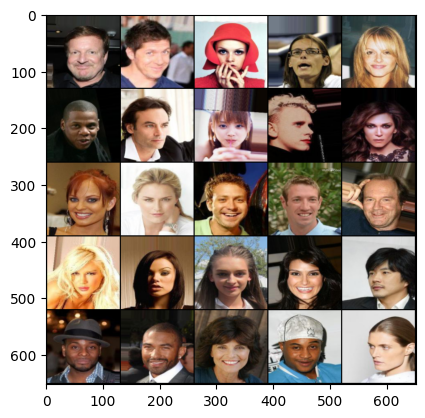

In [32]:
data_path = "/content/Dataset/img_align_celeba/img_align_celeba"
ds = Dataset(data_path, size = 128, lim = 10000)

dataloader = DataLoader(ds, batch_size= batch_size, shuffle= True)

gen = Generator(z_dim).to(device)
crit = Critic().to(device)

gen_opt = torch.optim.Adam(gen.parameters(), lr = lr, betas= (0.5, 0.9))
crit_opt = torch.optim.Adam(crit.parameters(), lr = lr, betas= (0.5, 0.9))
    
x,y = next(iter(dataloader))
show(x)

In [33]:
## gradient penalty calculation

def get_gp(real, fake, crit, alpha, gamma=10):
  mix_images = real * alpha + fake * (1-alpha) # 128 x 3 x 128 x 128
  mix_scores = crit(mix_images) # 128 x 1

  gradient = torch.autograd.grad(
      inputs = mix_images,
      outputs = mix_scores,
      grad_outputs=torch.ones_like(mix_scores),
      retain_graph=True,
      create_graph=True,
  )[0] # 128 x 3 x 128 x 128

  gradient = gradient.view(len(gradient), -1)   # 128 x 49152
  gradient_norm = gradient.norm(2, dim=1) 
  gp = gamma * ((gradient_norm-1)**2).mean()

  return gp



In [34]:
## Save and Load Checkpoints
root_path='./Dataset/'

def save_checkpoint(name):
  torch.save({
      'epoch': epoch,
      'model_state_dict': gen.state_dict(),
      'optimizer_state_dict': gen_opt.state_dict()      
  }, f"{root_path}G-{name}.pkl")

  torch.save({
      'epoch': epoch,
      'model_state_dict': crit.state_dict(),
      'optimizer_state_dict': crit_opt.state_dict()      
  }, f"{root_path}C-{name}.pkl")
  
  print("Saved checkpoint")

def load_checkpoint(name):
  checkpoint = torch.load(f"{root_path}G-{name}.pkl")
  gen.load_state_dict(checkpoint['model_state_dict'])
  gen_opt.load_state_dict(checkpoint['optimizer_state_dict'])

  checkpoint = torch.load(f"{root_path}C-{name}.pkl")
  crit.load_state_dict(checkpoint['model_state_dict'])
  crit_opt.load_state_dict(checkpoint['optimizer_state_dict'])

  print("Loaded checkpoint")

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  245 35
Saved checkpoint


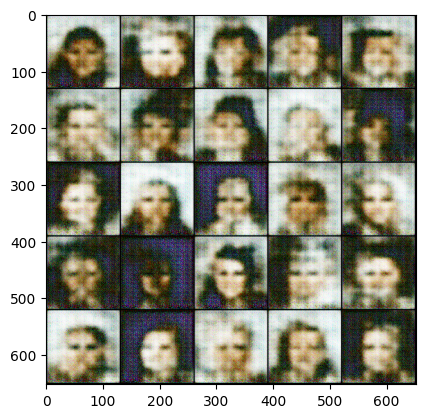

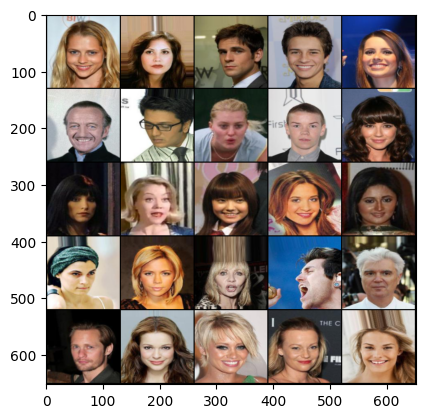

Epoch: 0: Step 245: Generator loss: 26.695075171334402, critic loss: -17.063628649030413


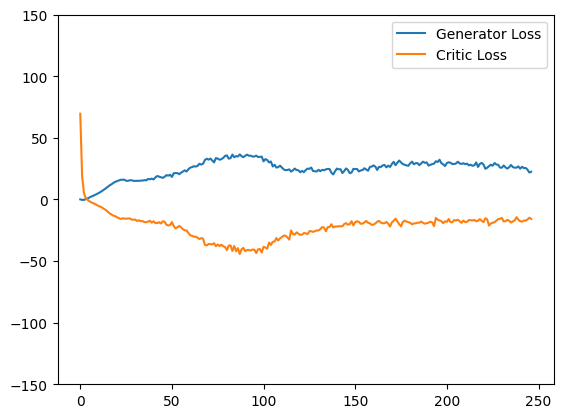

Saving checkpoint:  280 35
Saved checkpoint


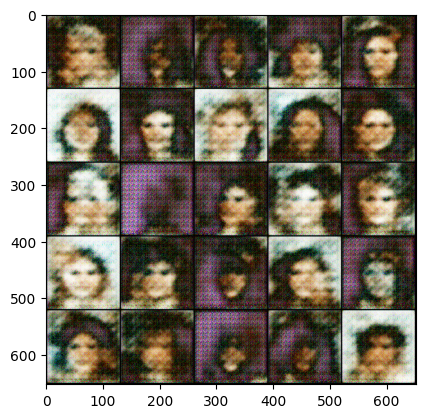

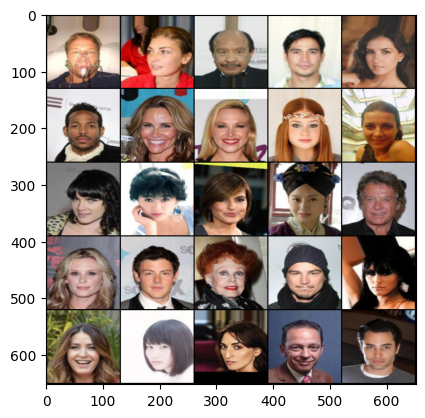

Epoch: 0: Step 280: Generator loss: 22.5629693712507, critic loss: -15.223234699794219


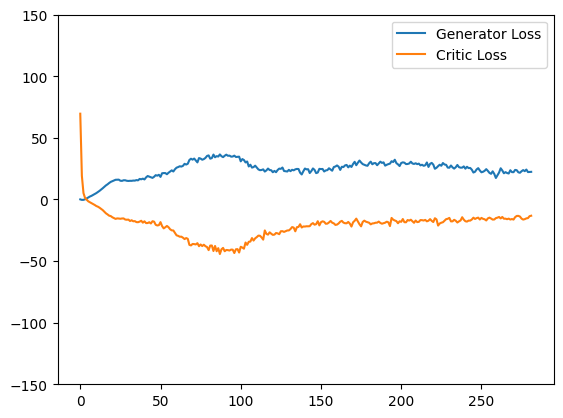

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  315 35
Saved checkpoint


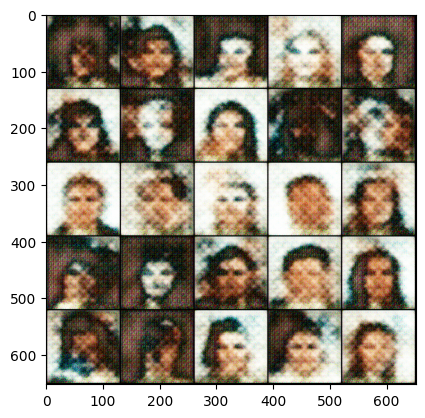

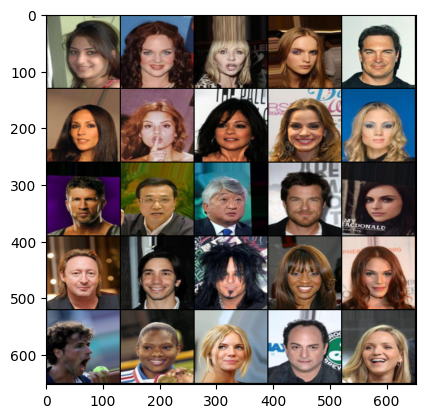

Epoch: 1: Step 315: Generator loss: 24.160160391671315, critic loss: -14.500686242239816


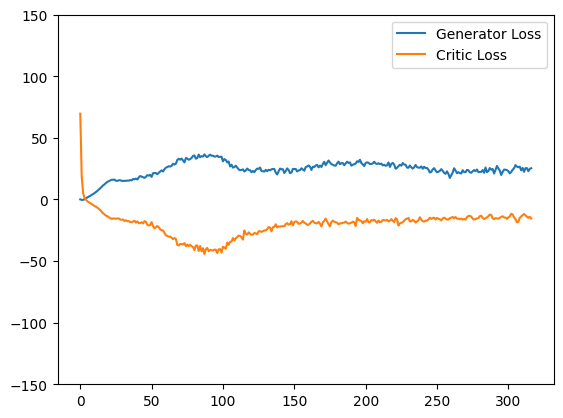

Saving checkpoint:  350 35
Saved checkpoint


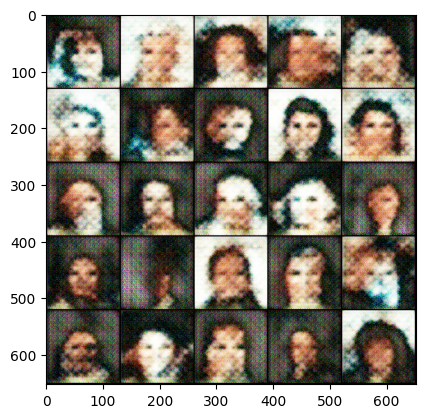

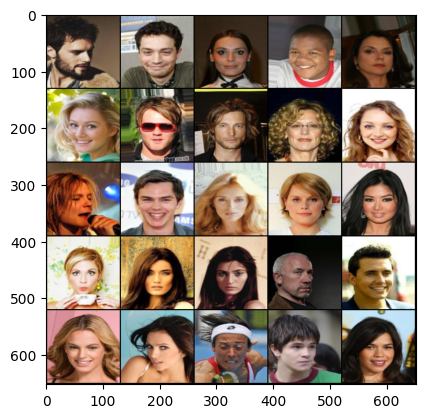

Epoch: 1: Step 350: Generator loss: 24.680096217564174, critic loss: -13.937037331717356


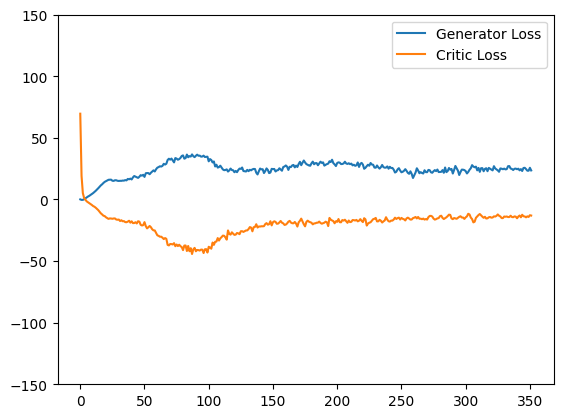

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  385 35
Saved checkpoint


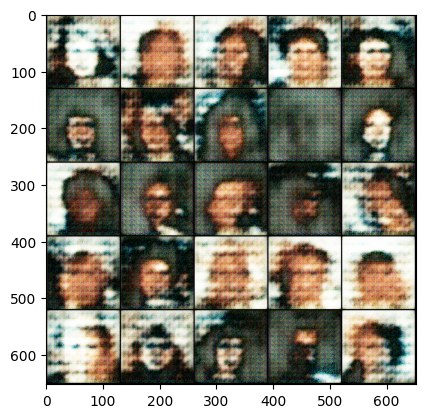

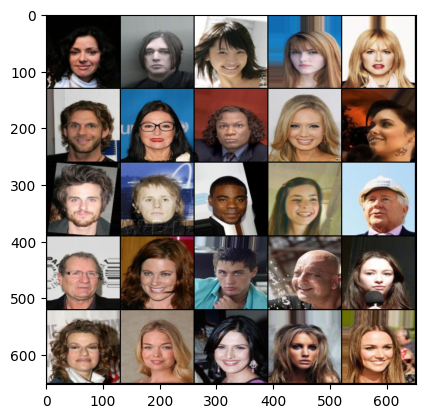

Epoch: 2: Step 385: Generator loss: 24.901161820547923, critic loss: -13.307270483289445


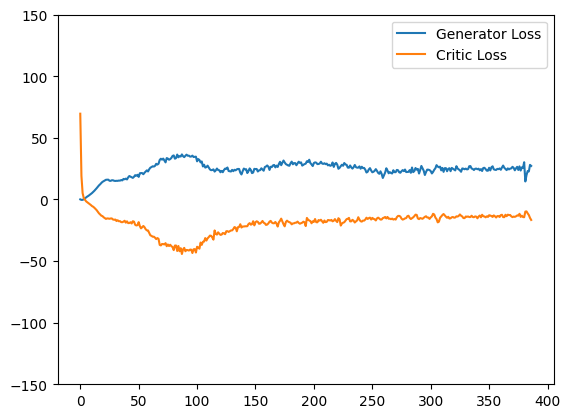

Saving checkpoint:  420 35
Saved checkpoint


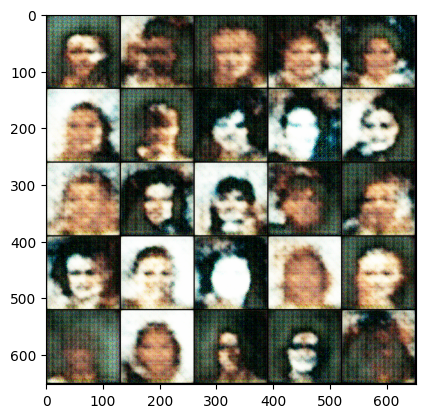

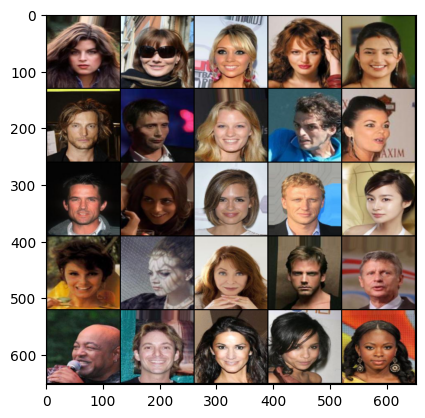

Epoch: 2: Step 420: Generator loss: 24.74820692879813, critic loss: -12.910677097865513


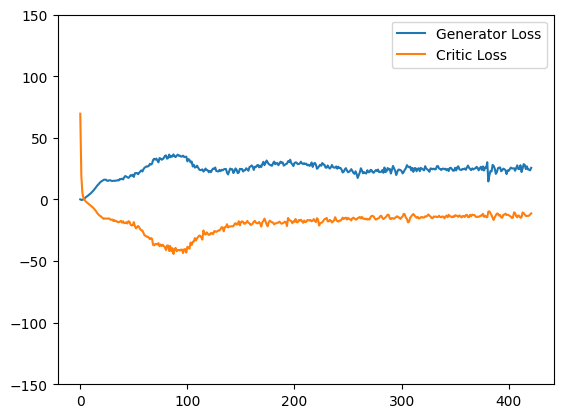

Saving checkpoint:  455 35
Saved checkpoint


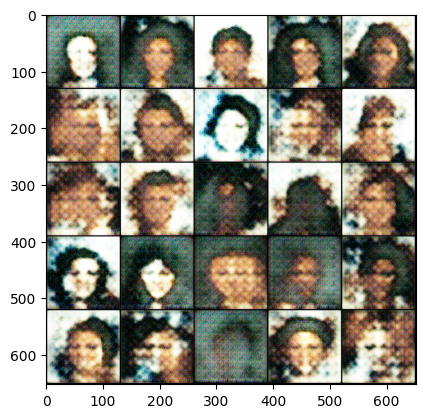

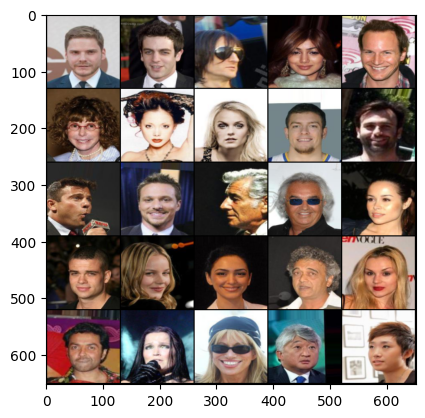

Epoch: 2: Step 455: Generator loss: 23.68294737679618, critic loss: -11.84924215316772


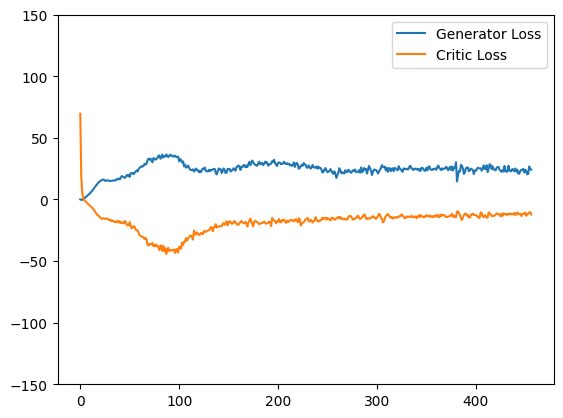

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  490 35
Saved checkpoint


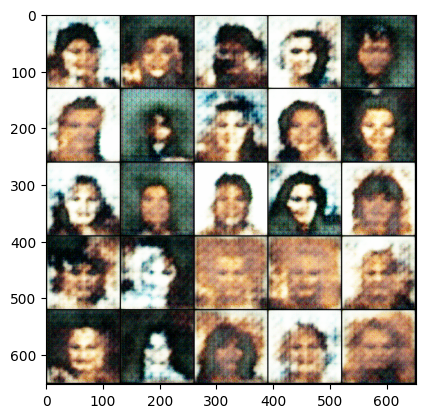

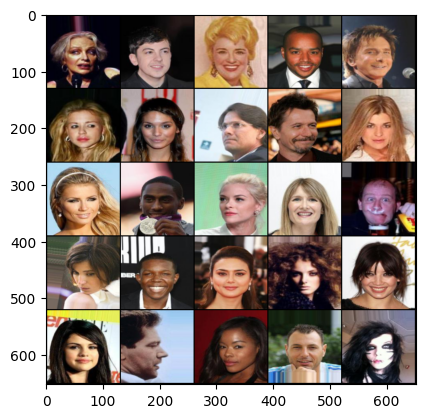

Epoch: 3: Step 490: Generator loss: 23.66510522024972, critic loss: -11.682481362479074


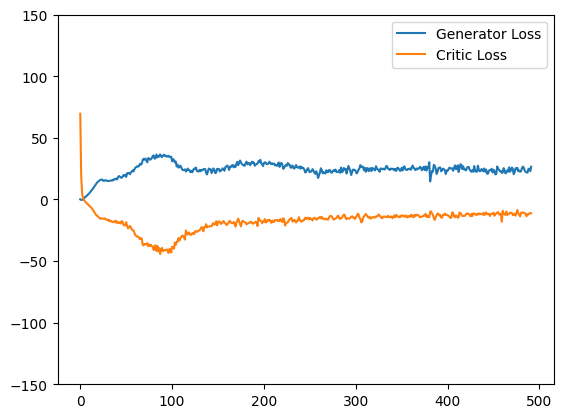

Saving checkpoint:  525 35
Saved checkpoint


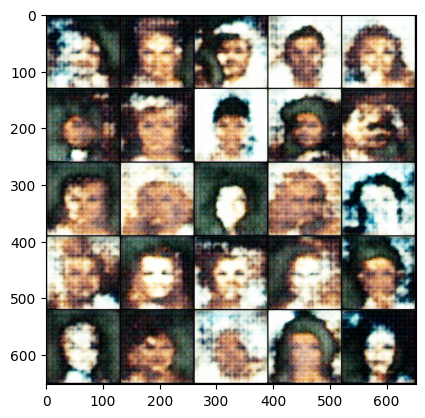

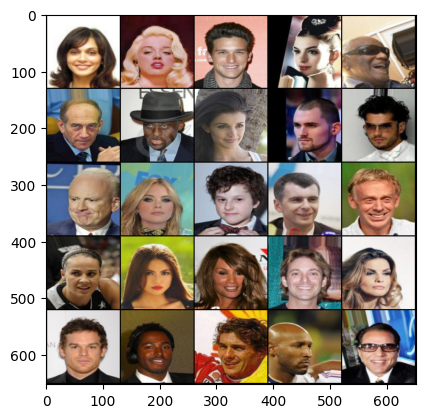

Epoch: 3: Step 525: Generator loss: 23.865578515189036, critic loss: -11.373259260995049


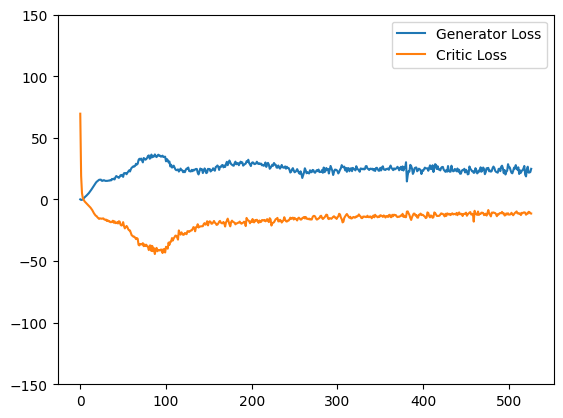

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  560 35
Saved checkpoint


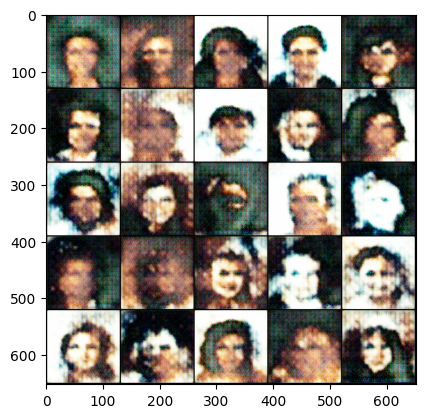

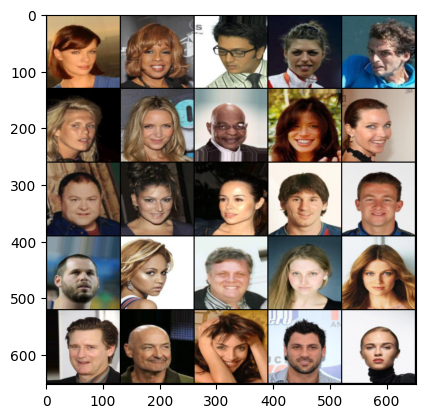

Epoch: 4: Step 560: Generator loss: 24.116976383754185, critic loss: -11.46092024394444


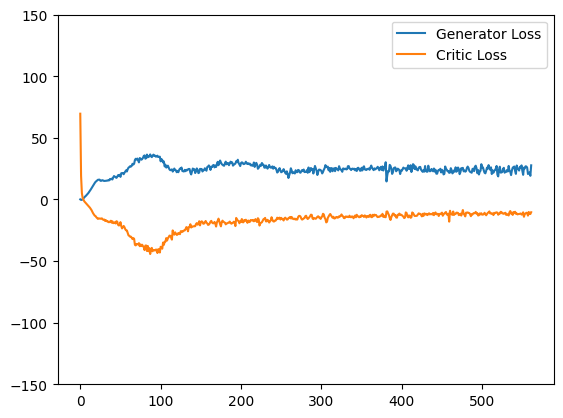

Saving checkpoint:  595 35
Saved checkpoint


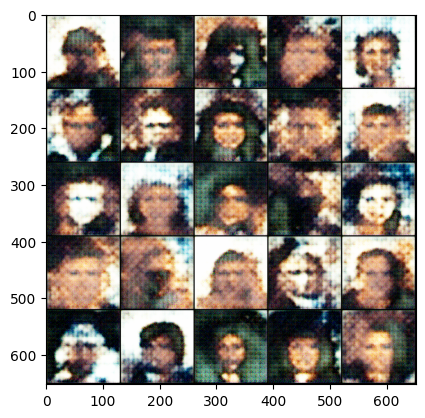

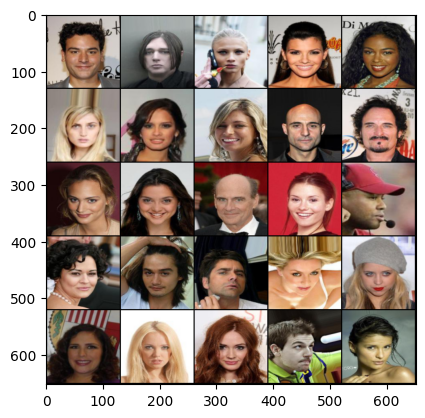

Epoch: 4: Step 595: Generator loss: 24.726236397879465, critic loss: -10.710072351183205


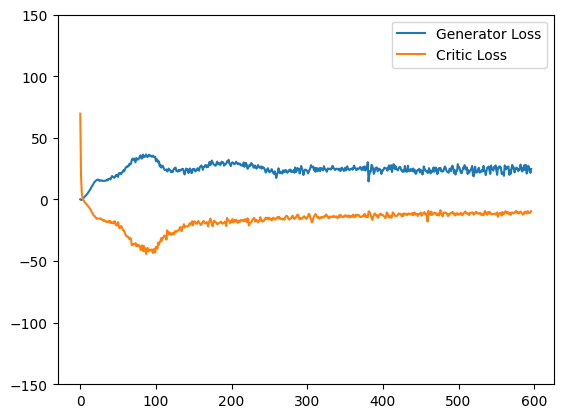

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  630 35
Saved checkpoint


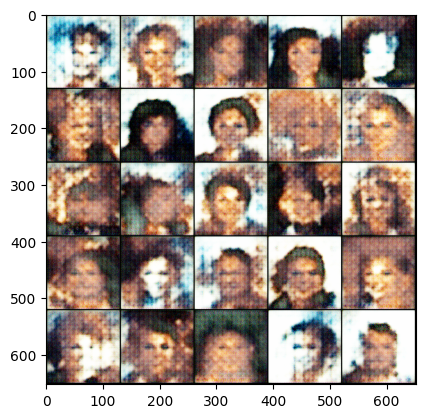

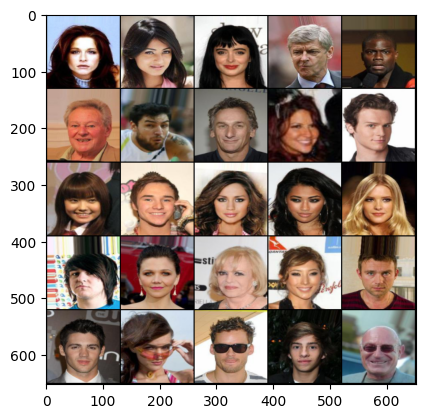

Epoch: 5: Step 630: Generator loss: 25.487760870797292, critic loss: -10.778095084599084


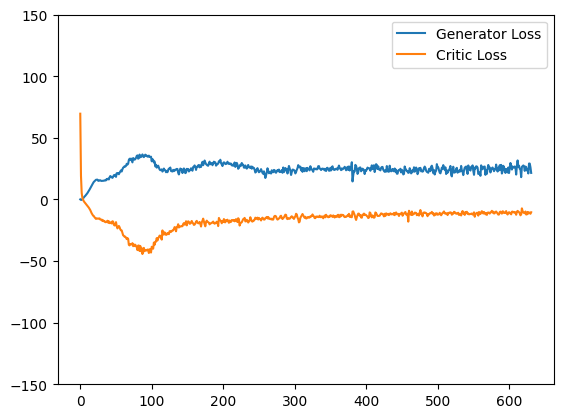

Saving checkpoint:  665 35
Saved checkpoint


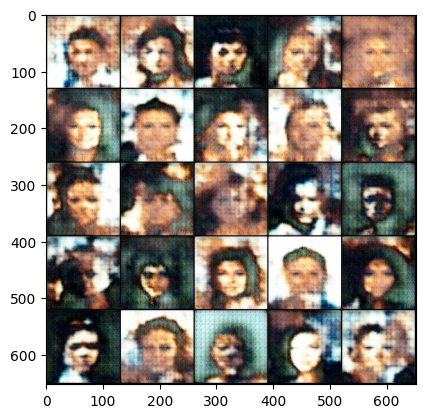

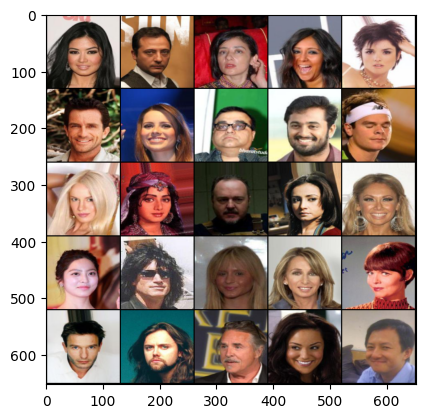

Epoch: 5: Step 665: Generator loss: 25.406500571114677, critic loss: -10.523028131212506


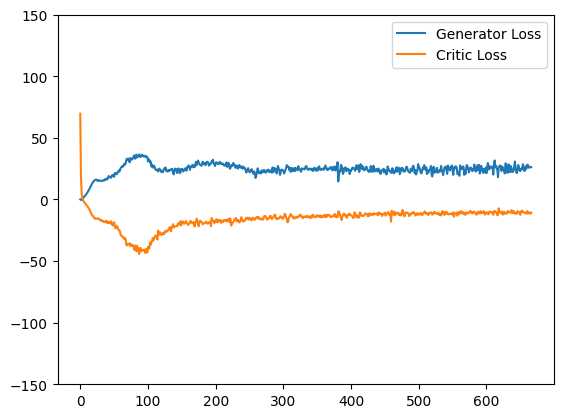

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  700 35
Saved checkpoint


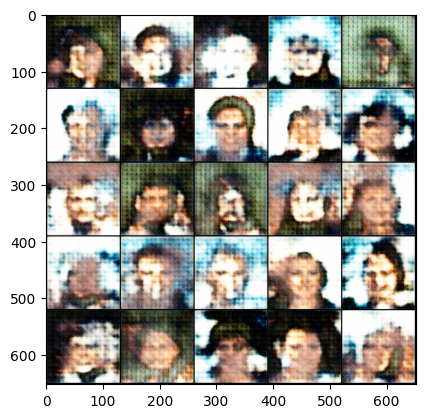

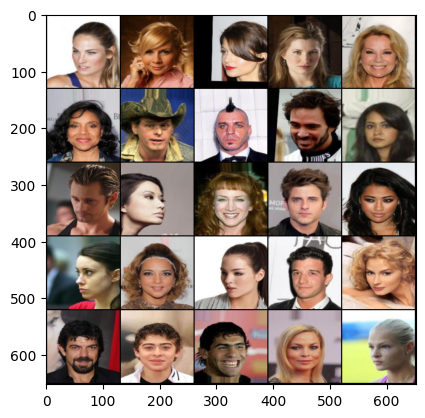

Epoch: 6: Step 700: Generator loss: 26.182406997680665, critic loss: -10.13696528026036


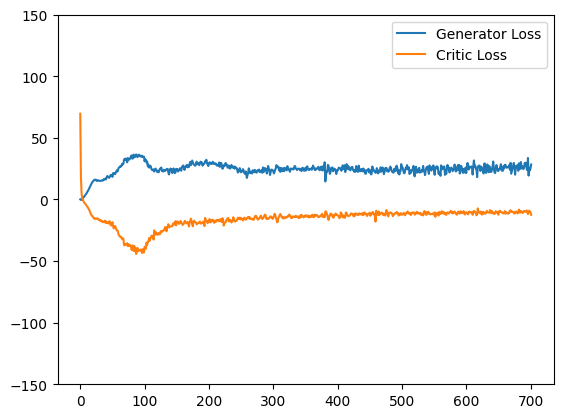

Saving checkpoint:  735 35
Saved checkpoint


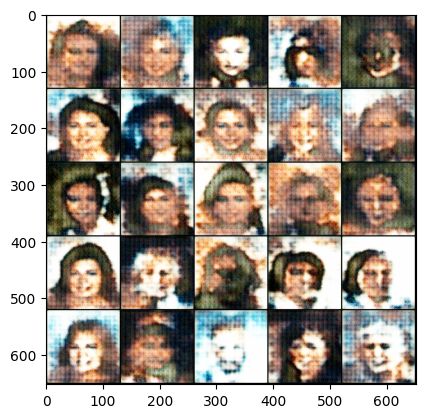

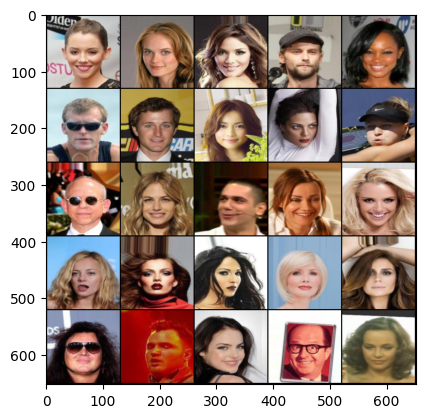

Epoch: 6: Step 735: Generator loss: 25.830162811279298, critic loss: -10.096881291525705


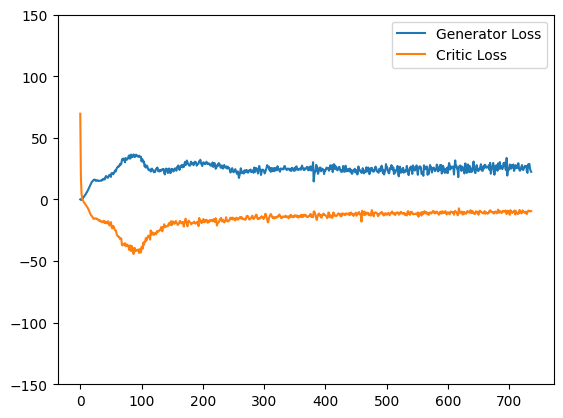

Saving checkpoint:  770 35
Saved checkpoint


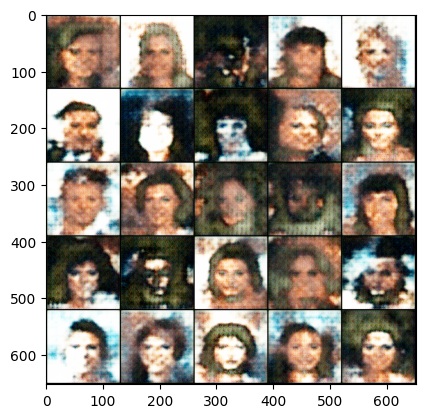

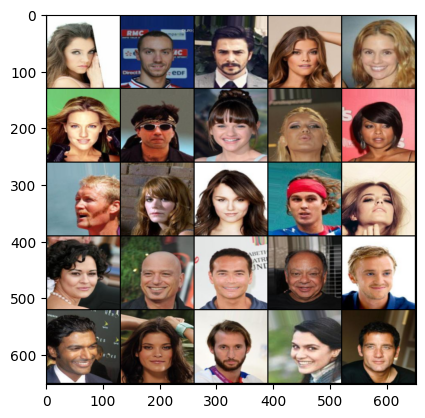

Epoch: 6: Step 770: Generator loss: 26.35703397478376, critic loss: -9.846096959795274


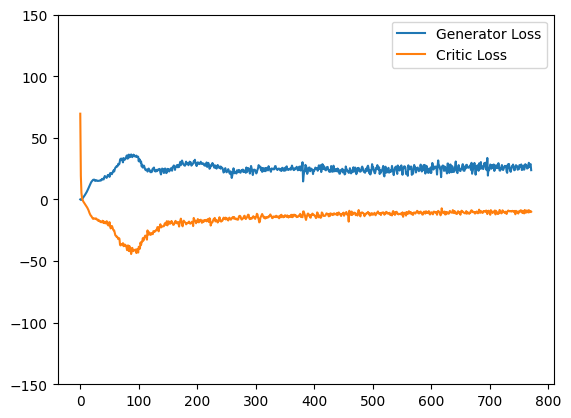

  0%|          | 0/79 [00:00<?, ?it/s]

Saving checkpoint:  805 35
Saved checkpoint


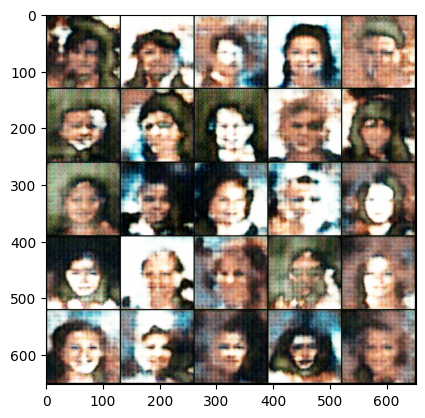

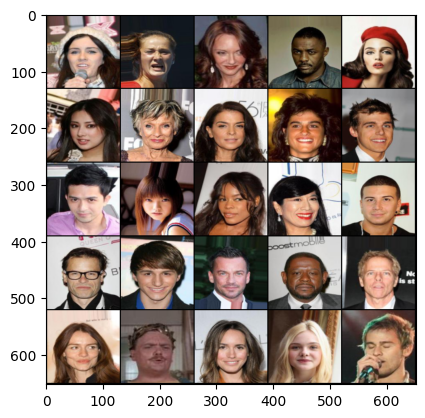

Epoch: 7: Step 805: Generator loss: 26.087555858067105, critic loss: -9.755970028468543


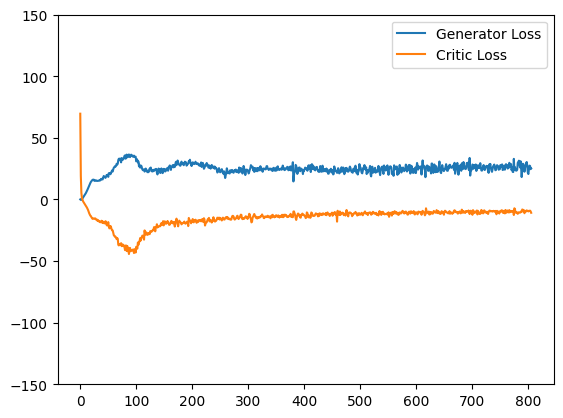

In [ ]:
## Training loop 

for epoch in range(n_epochs):
  for real, _ in tqdm(dataloader):
    cur_bs= len(real) #128
    real=real.to(device)

    ### CRITIC
    mean_crit_loss = 0
    for _ in range(crit_cycles):
      crit_opt.zero_grad()

      noise=gen_noise(cur_bs, z_dim)
      fake = gen(noise)
      crit_fake_pred = crit(fake.detach())
      crit_real_pred = crit(real)

      alpha=torch.rand(len(real),1,1,1,device=device, requires_grad=True) # 128 x 1 x 1 x 1
      gp = get_gp(real, fake.detach(), crit, alpha)

      crit_loss = crit_fake_pred.mean() - crit_real_pred.mean() + gp

      mean_crit_loss+=crit_loss.item() / crit_cycles

      crit_loss.backward(retain_graph=True)
      crit_opt.step()

    crit_losses+=[mean_crit_loss]

    ### GENERATOR
    gen_opt.zero_grad()
    noise = gen_noise(cur_bs, z_dim)
    fake = gen(noise)
    crit_fake_pred = crit(fake)

    gen_loss = -crit_fake_pred.mean()
    gen_loss.backward()
    gen_opt.step()

    gen_losses+=[gen_loss.item()]

    ### Stats  
   
    if cur_step % save_step == 0 and cur_step > 0:
      print("Saving checkpoint: ", cur_step, save_step)
      save_checkpoint("latest")

    if (cur_step % show_step == 0 and cur_step > 0):
      show(fake, name='fake')
      show(real, name='real')
      gen_mean=sum(gen_losses[-show_step:]) / show_step
      crit_mean = sum(crit_losses[-show_step:]) / show_step
      print(f"Epoch: {epoch}: Step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")

      plt.plot(
          range(len(gen_losses)),
          torch.Tensor(gen_losses),
          label="Generator Loss"
      )

      plt.plot(
          range(len(gen_losses)),
          torch.Tensor(crit_losses),
          label="Critic Loss"
      )

      plt.ylim(-150,150)
      plt.legend()
      plt.show()
    
    cur_step+=1
